# 1.1. Математический маятник — 🟢 + 🟡

**Цель:** отделить ошибку линейной модели от ошибки интегрирования и увидеть
зависимость периода от амплитуды. Все ячейки выполняются сверху вниз; анимации
имеют кнопки воспроизведения и ползунок. Параметры можно менять в ячейках ниже.

Состояние $y=(\theta,\dot\theta)$, углы в радианах. Берём $m=L=1$, $g=9.81$;
$\omega_0=\sqrt{g/L}$ и $T_0=2\pi/\omega_0$. Начальная угловая скорость нулевая.
Линейная модель: $\ddot\theta=-\omega_0^2\theta$; нелинейная:
$\ddot\theta=-\omega_0^2\sin\theta$.

Для линейной модели $U=mgL\theta^2/2$, для нелинейной $U=mgL(1-\cos\theta)$;
в обоих случаях $K=mL^2\dot\theta^2/2$. Смешивать эти определения при проверке
сохранения энергии нельзя. Разделы 1–2 закрывают базовый уровень, остальные — жёлтый.


In [1]:
import time
import re
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML, Markdown
from IPython import get_ipython
from scipy.optimize import brentq

get_ipython().run_line_magic('matplotlib', 'inline')
started = time.perf_counter()
plt.rcParams.update({'figure.dpi': 90, 'font.size': 10,
                     'axes.grid': True, 'animation.embed_limit': 50})
COLORS = plt.cm.viridis(np.linspace(0.08, 0.92, 10))

def step(rhs, state, h, method='RK4'):
    """Явный Эйлер или классический RK4 для автономной системы."""
    k1 = rhs(state)
    if method == 'Euler':
        return state + h*k1
    if method != 'RK4':
        raise ValueError(method)
    k2 = rhs(state + h*k1/2)
    k3 = rhs(state + h*k2/2)
    k4 = rhs(state + h*k3)
    return state + h*(k1 + 2*k2 + 2*k3 + k4)/6

def integrate(rhs, initial, duration, h, method='RK4'):
    # Последний момент точно равен duration; фактический шаг не больше h.
    n = int(np.ceil(duration/h))
    t = np.linspace(0, duration, n+1)
    y = np.empty((n+1, len(initial)))
    y[0] = initial
    for j in range(n):
        y[j+1] = step(rhs, y[j], t[j+1]-t[j], method)
    return t, y

def sample(t, y, times):
    """Интерполяция только для кадров; ошибки считаются на расчётной сетке."""
    return np.column_stack([np.interp(times, t, y[:, j]) for j in range(y.shape[1])])

def table(headers, rows):
    escaped = lambda values: [str(value).replace('|', '&#124;') for value in values]
    display(Markdown('| ' + ' | '.join(escaped(headers)) + ' |\n| ' +
                     ' | '.join(['---']*len(headers)) + ' |\n' +
                     '\n'.join('| ' + ' | '.join(escaped(row)) + ' |' for row in rows)))

def show_animation(fig, update, frames, filename):
    # Кадры встроены: работают без ffmpeg, сети и дополнительных виджетов.
    movie = FuncAnimation(fig, update, frames=frames, interval=70, blit=False)
    html = movie.to_jshtml(default_mode='once')
    # Matplotlib использует внешний шрифт для значков; заменяем локальным текстом.
    html = re.sub(r'<link\s+rel="stylesheet"\s+href="[^"]+">', '', html)
    icons = {'fa-minus': '−', 'fa-plus': '+', 'fa-fast-backward': '⏮',
             'fa-backward': '◀|', 'fa-step-backward': '|◀', 'fa-play': '▶',
             'fa-play fa-flip-horizontal': '◀', 'fa-step-forward': '▶|', 'fa-pause': 'Ⅱ',
             'fa-stop': '■', 'fa-forward': '|▶', 'fa-fast-forward': '⏭',
             'fa-refresh': '↻'}
    html = re.sub(r'<i class="fa ([^"]+)"[^>]*></i>',
                  lambda match: icons.get(match[1], match[1].removeprefix('fa-')), html)
    plt.close(fig)
    out = Path('animations')
    out.mkdir(exist_ok=True)
    (out/filename).write_text('<!doctype html><meta charset="utf-8">' + html, encoding='utf-8')
    display(HTML(html))


In [2]:
g, L, m = 9.81, 1.0, 1.0
w0 = np.sqrt(g/L)
T0 = 2*np.pi/w0

def pendulum(length=L, nonlinear=True):
    return lambda y: np.array([y[1], -g/length*(np.sin(y[0]) if nonlinear else y[0])])

def energy(y, nonlinear=True, length=L):
    kinetic = m*length**2*y[:, 1]**2/2
    potential = m*g*length*(1-np.cos(y[:, 0]) if nonlinear else y[:, 0]**2/2)
    return kinetic, potential


## 1. Линейная модель: точное решение и сходимость

При $\theta(0)=A$, $\dot\theta(0)=0$ точное решение равно
$\theta=A\cos\omega_0t$, $\dot\theta=-A\omega_0\sin\omega_0t$.
Считаем до $5T_0$. Ошибка — максимум $|\theta_h-\theta_{exact}|$ по всей сетке.
При делении шага пополам ожидается примерно двукратное уменьшение ошибки Эйлера
и шестнадцатикратное для RK4 в асимптотическом режиме.


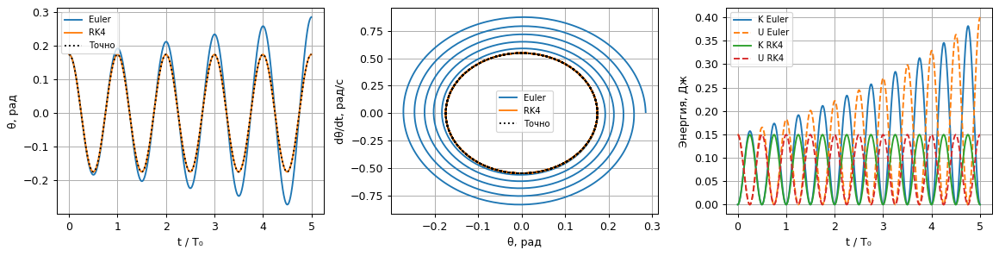

| Метод | Шаг | max &#124;Δθ&#124;, рад |
| --- | --- | --- |
| Euler | T₀/100 | 2.915e-01 |
| Euler | T₀/200 | 1.111e-01 |
| Euler | T₀/400 | 4.881e-02 |
| Euler | T₀/800 | 2.291e-02 |
| RK4 | T₀/100 | 6.725e-07 |
| RK4 | T₀/200 | 4.217e-08 |
| RK4 | T₀/400 | 2.640e-09 |
| RK4 | T₀/800 | 1.651e-10 |

In [3]:
A = np.deg2rad(10)
fig, ax = plt.subplots(1, 3, figsize=(13, 3.4))
rows, errors = [], {}
for method in ['Euler', 'RK4']:
    errors[method] = []
    for n in [100, 200, 400, 800]:
        t, y = integrate(pendulum(nonlinear=False), [A, 0], 5*T0, T0/n, method)
        err = np.max(np.abs(y[:, 0]-A*np.cos(w0*t)))
        errors[method].append(err)
        rows.append([method, f'T₀/{n}', f'{err:.3e}'])
    t, y = integrate(pendulum(nonlinear=False), [A, 0], 5*T0, T0/200, method)
    K, U = energy(y, nonlinear=False)
    ax[0].plot(t/T0, y[:, 0], label=method)
    ax[1].plot(y[:, 0], y[:, 1], label=method)
    ax[2].plot(t/T0, K, label=f'K {method}')
    ax[2].plot(t/T0, U, '--', label=f'U {method}')
tt = np.linspace(0, 5*T0, 2000)
ax[0].plot(tt/T0, A*np.cos(w0*tt), 'k:', label='Точно')
ax[1].plot(A*np.cos(w0*tt), -A*w0*np.sin(w0*tt), 'k:', label='Точно')
for a, xlabel, ylabel in zip(ax, ['t / T₀', 'θ, рад', 't / T₀'], ['θ, рад', 'dθ/dt, рад/с', 'Энергия, Дж']):
    a.set(xlabel=xlabel, ylabel=ylabel); a.legend(fontsize=8)
fig.tight_layout(); display(fig); plt.close(fig)
table(['Метод', 'Шаг', 'max |Δθ|, рад'], rows)
assert errors['RK4'][-2]/errors['RK4'][-1] > 12
assert errors['Euler'][-1] < errors['Euler'][0]


## 2. Нелинейная модель: период и критерий точности линейного приближения

Независимый эталон для $0<A<\pi$:
$T(A)=4\sqrt{L/g}\,K(\sin^2(A/2))$. Здесь `scipy.special.ellipk` принимает
**параметр** $m=\sin^2(A/2)$, а не модуль $\sin(A/2)$.

Численный период равен четырём временам первого пересечения $\theta=0$ сверху
при старте из покоя. После обнаружения смены знака уточняем событие внутри шага:
ищем корень $\theta(\mathrm{RK4}(y_j,\delta t))=0$. Это устраняет ошибку простого
округления к узлу сетки; интегрирование до события всё ещё имеет свою ошибку.

Слово «достаточно» определим явно: относительная ошибка периода
$(T(A)-T_0)/T(A)\leq1\%$. Также посчитаем порог для 5%.


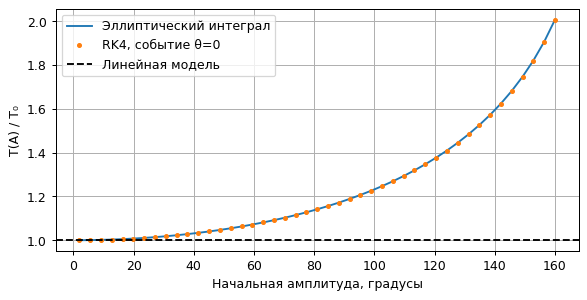

**Ответ:** при выбранном критерии линейная модель предсказывает период с ошибкой до 1% примерно при **A ≤ 22.93°**, до 5% — при **A ≤ 51.35°**. При росте амплитуды нелинейный период растёт.

In [4]:
from scipy.special import ellipk

def exact_period(amplitude, length=L):
    return 4*np.sqrt(length/g)*ellipk(np.sin(amplitude/2)**2)

def measured_period(amplitude, h):
    rhs = pendulum()
    t, y = integrate(rhs, [amplitude, 0], exact_period(amplitude)/2, h)
    j = np.flatnonzero((y[:-1, 0] > 0) & (y[1:, 0] <= 0))[0]
    dt = brentq(lambda dt: step(rhs, y[j], dt)[0], 0, t[j+1]-t[j], xtol=1e-14)
    return 4*(t[j]+dt)

degrees = np.linspace(2, 160, 45)
amplitudes = np.deg2rad(degrees)
periods = np.array([measured_period(a, T0/250) for a in amplitudes])
fig, ax = plt.subplots(figsize=(7.5, 3.5))
ax.plot(degrees, exact_period(amplitudes)/T0, label='Эллиптический интеграл')
ax.plot(degrees, periods/T0, '.', label='RK4, событие θ=0')
ax.axhline(1, color='k', ls='--', label='Линейная модель')
ax.set(xlabel='Начальная амплитуда, градусы', ylabel='T(A) / T₀'); ax.legend()
display(fig); plt.close(fig)
thresholds = [np.rad2deg(brentq(lambda a: 1-T0/exact_period(a)-eps, 1e-6, 3.0)) for eps in [.01, .05]]
display(Markdown(f'**Ответ:** при выбранном критерии линейная модель предсказывает период '
                 f'с ошибкой до 1% примерно при **A ≤ {thresholds[0]:.2f}°**, '
                 f'до 5% — при **A ≤ {thresholds[1]:.2f}°**. '
                 'При росте амплитуды нелинейный период растёт.'))
assert np.max(np.abs(periods/exact_period(amplitudes)-1)) < 2e-6


## 3. Раздельно: ошибка модели и ошибка шага при A = 90°

Первый график сравнивает линейную модель с нелинейным расчётом на мелкой сетке.
Второй показывает только ошибку нелинейного периода относительно точной формулы.
Уменьшение шага не исправляет ошибку линеаризации. Дополнительно проверяем
обмен кинетической и потенциальной энергией в нелинейной системе.


| Шаг | Численный период, с | &#124;T_h − T(A)&#124;, с |
| --- | --- | --- |
| T₀/25 | 2.3678732220 | 3.127e-05 |
| T₀/50 | 2.3678442157 | 2.268e-06 |
| T₀/100 | 2.3678420867 | 1.391e-07 |
| T₀/200 | 2.3678419563 | 8.697e-09 |

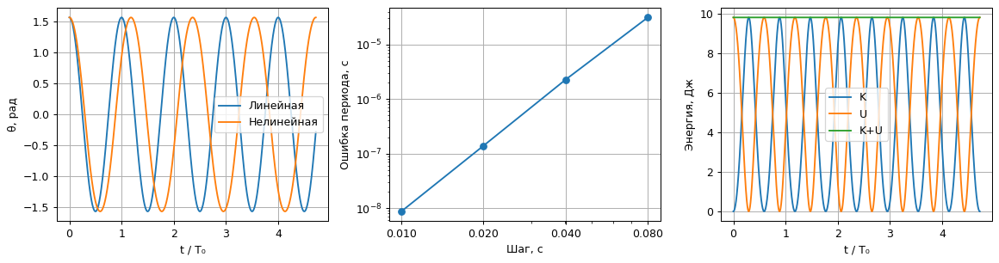

При A=90° ошибка линейного периода составляет **15.28%**. Ошибка RK4 при самом мелком проверенном шаге — **8.70e-09 с**.

In [5]:
A = np.pi/2
TA = exact_period(A)
rows, period_errors = [], []
ns = np.array([25, 50, 100, 200])
for n in ns:
    numerical = measured_period(A, T0/n)
    error = abs(numerical-TA)
    period_errors.append(error)
    rows.append([f'T₀/{n}', f'{numerical:.10f}', f'{error:.3e}'])
table(['Шаг', 'Численный период, с', '|T_h − T(A)|, с'], rows)
t, yn = integrate(pendulum(), [A, 0], 4*TA, T0/500)
yl = np.column_stack([A*np.cos(w0*t), -A*w0*np.sin(w0*t)])
K, U = energy(yn)
fig, ax = plt.subplots(1, 3, figsize=(13, 3.5))
ax[0].plot(t/T0, yl[:, 0], label='Линейная'); ax[0].plot(t/T0, yn[:, 0], label='Нелинейная')
ax[0].set(xlabel='t / T₀', ylabel='θ, рад'); ax[0].legend()
ax[1].loglog(T0/ns, period_errors, 'o-'); ax[1].set(xlabel='Шаг, с', ylabel='Ошибка периода, с')
ax[1].set_xticks(T0/ns, [f'{h:.3f}' for h in T0/ns]); ax[1].xaxis.set_minor_formatter(plt.NullFormatter())
for vals, label in [(K, 'K'), (U, 'U'), (K+U, 'K+U')]:
    ax[2].plot(t/T0, vals, label=label)
ax[2].set(xlabel='t / T₀', ylabel='Энергия, Дж'); ax[2].legend()
fig.tight_layout(); display(fig); plt.close(fig)
display(Markdown(f'При A=90° ошибка линейного периода составляет **{100*(1-T0/TA):.2f}%**. '
                 f'Ошибка RK4 при самом мелком проверенном шаге — **{period_errors[-1]:.2e} с**.'))
assert period_errors[-2]/period_errors[-1] > 12
assert np.max(np.abs((K+U)/(K[0]+U[0])-1)) < 1e-7


## 4. Анимация: линейный и нелинейный маятники с фазовыми следами

Слева геометрическое положение груза; справа $(\theta,\dot\theta)$.
Оба движения показаны в один физический момент времени. Для линейного маятника
используется точное решение, для нелинейного — RK4 из предыдущей ячейки.


In [6]:
frames = np.linspace(0, 3*TA, 101)
nonlinear = sample(t, yn, frames)
linear = np.column_stack([A*np.cos(w0*frames), -A*w0*np.sin(w0*frames)])
fig, ax = plt.subplots(1, 2, figsize=(8, 3.4), dpi=75)
rods, trails, dots = [], [], []
for color, label in [('tab:blue', 'Линейный'), ('tab:orange', 'Нелинейный')]:
    rods.append(ax[0].plot([], [], 'o-', color=color, label=label)[0])
    trails.append(ax[1].plot([], [], color=color, alpha=.7)[0])
    dots.append(ax[1].plot([], [], 'o', color=color, label=label)[0])
ax[0].set(xlim=(-1.2, 1.2), ylim=(-1.2, .3), aspect='equal', xlabel='x, м', ylabel='y, м')
ax[1].set(xlim=(-1.8, 1.8), ylim=(-5.3, 5.3), xlabel='θ, рад', ylabel='dθ/dt, рад/с')
ax[0].legend(); title = fig.suptitle(''); fig.tight_layout()
def update(j):
    for state, rod, trail, dot in zip([linear, nonlinear], rods, trails, dots):
        angle = state[j, 0]
        rod.set_data([0, L*np.sin(angle)], [0, -L*np.cos(angle)])
        trail.set_data(state[:j+1, 0], state[:j+1, 1])
        dot.set_data([state[j, 0]], [state[j, 1]])
    title.set_text(f'A = 90°, t = {frames[j]:.2f} с')
show_animation(fig, update, len(frames), '1.1_comparison.html')


## 5. Десять длин и соизмеримые частоты

Для всех маятников $A=20°$, но $\omega_{0,i}=n_i\omega_b$, $n_i=10,\ldots,19$,
$\omega_b=0.4$ с⁻¹ и $L_i=g/\omega_{0,i}^2$.
Используем **нелинейную** модель: при одинаковой амплитуде множитель поправки
к периоду одинаков, поэтому соизмеримость сохраняется.
Общее время повторения $T_{sync}=4K(\sin^2(A/2))/\omega_b$.
Чтобы не пропускать быстрые колебания, здесь 241 кадр.


In [7]:
ensemble_A = np.deg2rad(20)
harmonics = np.arange(10, 20)
wb = .4
lengths = g/(harmonics*wb)**2
sync = 4*ellipk(np.sin(ensemble_A/2)**2)/wb
frames = np.linspace(0, sync, 241)
states = []
for length in lengths:
    ti, yi = integrate(pendulum(length), [ensemble_A, 0], sync, .002)
    states.append(sample(ti, yi, frames))
fig, ax = plt.subplots(figsize=(9, 3.4), dpi=75)
pivots = np.arange(10)*.6
rods = [ax.plot([], [], 'o-', color=c)[0] for c in COLORS]
for x, n in zip(pivots, harmonics):
    ax.text(x, .06, f'n={n}', ha='center', fontsize=8)
ax.set(xlim=(-.5, pivots[-1]+.5), ylim=(-.72, .17), xlabel='x, м', ylabel='y, м', aspect='equal')
title = ax.set_title(''); fig.tight_layout()
def update(j):
    for i, rod in enumerate(rods):
        theta = states[i][j, 0]
        rod.set_data([pivots[i], pivots[i]+lengths[i]*np.sin(theta)], [0, -lengths[i]*np.cos(theta)])
    title.set_text(f'Соизмеримые частоты, t / T_sync = {frames[j]/sync:.3f}')
show_animation(fig, update, len(frames), '1.1_lengths.html')
assert max(abs(s[-1, 0]-ensemble_A) for s in states) < 1e-6


## 6. Одинаковые длины, разные амплитуды

Все длины равны 1 м, начальные углы от 10° до 150°, старт из покоя.
Точки подвеса разнесены только для читаемости. Даже без взаимодействия и
диссипации фазы расходятся: большие амплитуды имеют большие периоды.


In [8]:
angles = np.deg2rad(np.linspace(10, 150, 10))
frames = np.linspace(0, 4*T0, 121)
states = []
for angle in angles:
    ti, yi = integrate(pendulum(), [angle, 0], frames[-1], T0/400)
    states.append(sample(ti, yi, frames))
fig, axes = plt.subplots(2, 5, figsize=(9, 4.5), dpi=75, sharex=True, sharey=True)
rods = []
for panel, angle, color in zip(axes.flat, angles, COLORS):
    rods.append(panel.plot([], [], 'o-', color=color)[0])
    panel.set(xlim=(-1.2, 1.2), ylim=(-1.2, 1.05), aspect='equal', title=f'A={np.rad2deg(angle):.0f}°')
    panel.set_xticks([-1, 0, 1]); panel.set_yticks([-1, 0, 1])
title = fig.suptitle(''); fig.tight_layout(rect=(0, 0, 1, .92))
def update(j):
    for i, rod in enumerate(rods):
        theta = states[i][j, 0]
        rod.set_data([0, L*np.sin(theta)], [0, -L*np.cos(theta)])
    title.set_text(f'Одинаковая длина, разные амплитуды; t = {frames[j]:.2f} с')
show_animation(fig, update, len(frames), '1.1_amplitudes.html')


## Выводы и оценка сложности

- RK4 сходится к нелинейной модели; переход к малому шагу не делает её линейной.
- При критерии ошибки периода 1% допустимая амплитуда около 23°; ответ зависит от допуска.
- Соизмеримые частоты можно получить подбором длин, если начальные амплитуды одинаковы.
  При разных амплитудах поправки к периодам различаются.
- Самые содержательные этапы: определение периода по событию и разделение двух ошибок.
  Самая трудоёмкая техническая часть: три анимации и синхронизация панелей.

**Оценка для студента после первого семинара:** 6–10 часов при знакомстве с Python,
10–16 часов при первом опыте NumPy/Matplotlib/Jupyter. Это экспертная оценка,
а не измеренное время работы студента. Расчёт периода через эллиптический интеграл —
дополнительный эталон для проверки; для выполнения задания достаточно сходимости численного периода.


In [9]:
print(f'Все численные проверки пройдены. Полное выполнение: {time.perf_counter()-started:.1f} с.')


Все численные проверки пройдены. Полное выполнение: 30.1 с.
